In [11]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt

In [12]:

# Load the data
data = pd.read_csv('./../Task1.csv')

# Convert the "Date" column to datetime format
data["Date"] = pd.to_datetime(data["Date"], format="%d-%m-%Y")

# Create an empty DataFrame to store the cleaned data for each SKU 
# Clean1 is to remove 0's
#clean2 is for outlier Capping
#clean3 is for lowess smoothing

cleaned_data_1 = pd.DataFrame()
cleaned_data_2=pd.DataFrame()
cleaned_data_3=pd.DataFrame()


In [13]:

# Iterate over unique SKUs in the data
for sku in data['SKU'].unique():
    # Select data for the current SKU
    sku_data = data[data['SKU'] == sku].copy()

    # Convert the "Date" column to datetime format
    sku_data["Date"] = pd.to_datetime(sku_data["Date"], format="%d-%m-%Y")

    sku_data = sku_data.sort_values('Date')

    # Convert the "Date" column back to string format with "mm-dd-yyyy" format
    sku_data["Date"] = sku_data["Date"].dt.strftime("%d-%m-%Y")
    
  
    # Find the index of the first positive value
    first_positive_index = sku_data[sku_data['Quantity'] > 0]['Quantity'].first_valid_index()
    
    # Remove data before the first positive value
    sku_data = sku_data.loc[first_positive_index:].copy()
    
    # Calculate the mean of only positive numbers
    positive_values = sku_data[sku_data['Quantity'] > 0]['Quantity'].dropna()
    mean_value = positive_values.mean()
    
    # Replace negative and zero values with the mean of positive numbers
    sku_data['Quantity'] = sku_data['Quantity'].apply(lambda x: mean_value if x <= 0 else x)
    
    # Append the cleaned data for the current SKU to the overall cleaned_data DataFrame
    cleaned_data_1 = cleaned_data_1.append(sku_data)

    # Apply outlier capping
    Q1 = sku_data['Quantity'].quantile(0.25)
    Q3 = sku_data['Quantity'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    sku_data['Quantity'] = sku_data['Quantity'].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)
    
    # Append the cleaned data for the current SKU to the overall cleaned_data DataFrame
    cleaned_data_2 = cleaned_data_2.append(sku_data)

    # Apply lowess smoothing
    n=(4.0/len(sku_data))
    smoothed_values = sm.nonparametric.lowess(sku_data['Quantity'], sku_data.index, frac=n)
    
    sku_data['Quantity'] = smoothed_values[:, 1]
    
    # Append the cleaned data for the current SKU to the overall cleaned_data DataFrame
    cleaned_data_3 = cleaned_data_3.append(sku_data)




C:\Users\p90014646\AppData\Local\Temp\ipykernel_12324\1970920506.py:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cleaned_data_1 = cleaned_data_1.append(sku_data)
C:\Users\p90014646\AppData\Local\Temp\ipykernel_12324\1970920506.py:40: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cleaned_data_2 = cleaned_data_2.append(sku_data)
C:\Users\p90014646\AppData\Local\Temp\ipykernel_12324\1970920506.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cleaned_data_3 = cleaned_data_3.append(sku_data)
C:\Users\p90014646\AppData\Local\Temp\ipykernel_12324\1970920506.py:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cleaned_data_1 = cleaned_

In [14]:
# Reset the index of the cleaned_data DataFrame
cleaned_data_1.reset_index(drop=True, inplace=True)

# Reset the index of the cleaned_data DataFrame
cleaned_data_2.reset_index(drop=True, inplace=True)

# Reset the index of the cleaned_data DataFrame
cleaned_data_3.reset_index(drop=True, inplace=True)

# Save the cleaned data to a single CSV file
cleaned_data_1.to_csv('task_cleaned_data_1.csv', index=False)
cleaned_data_2.to_csv('task_cleaned_data_2.csv', index=False)
cleaned_data_3.to_csv('task_cleaned_data_3.csv', index=False)


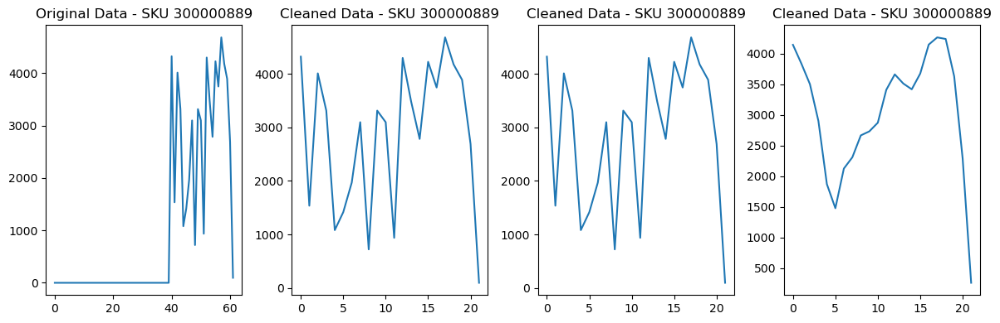

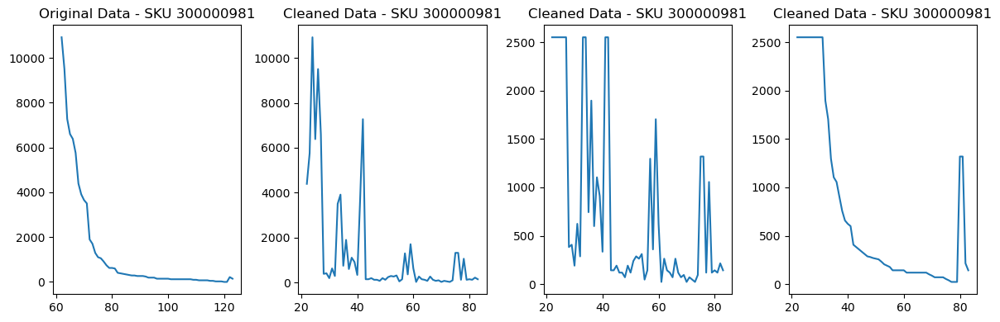

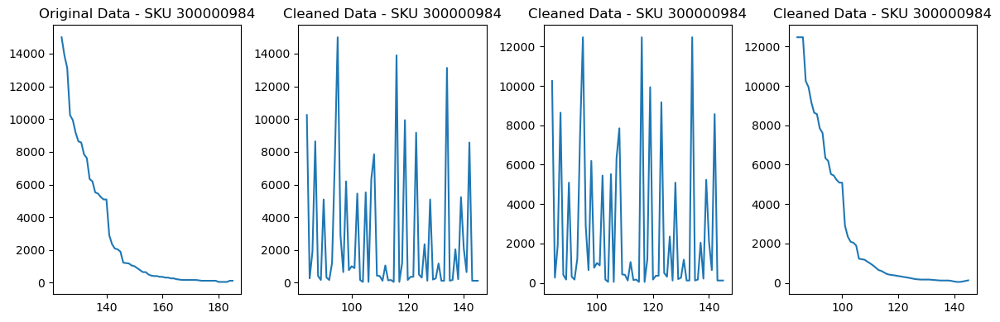

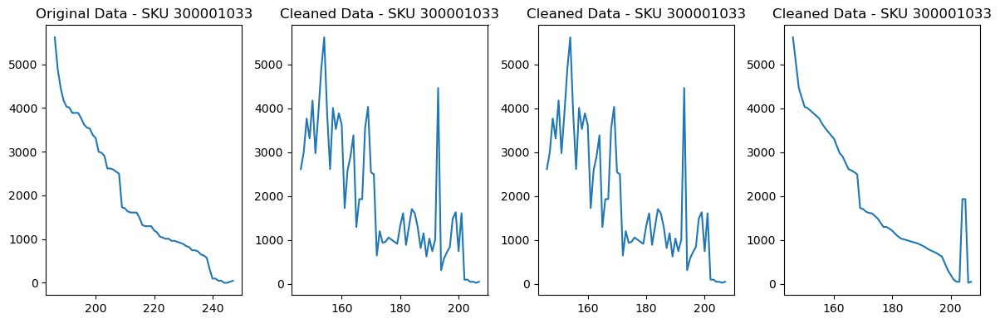

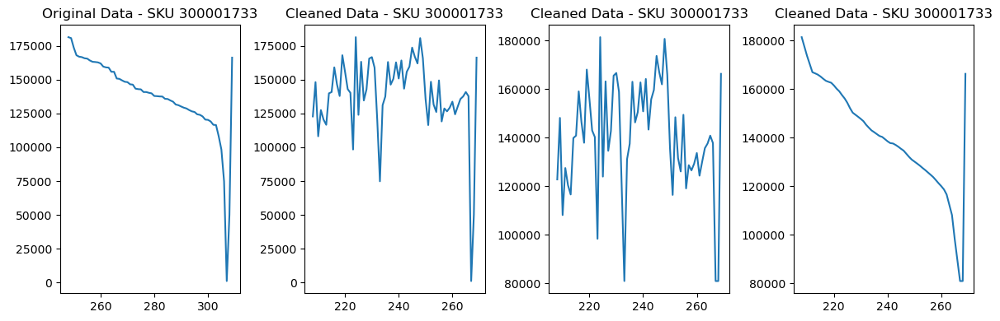

...

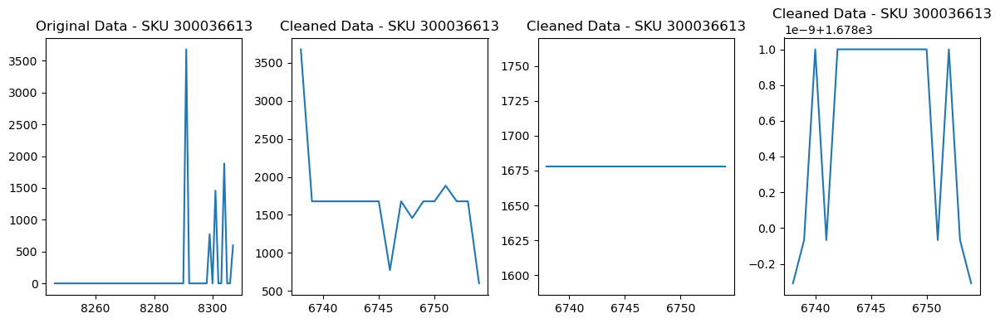

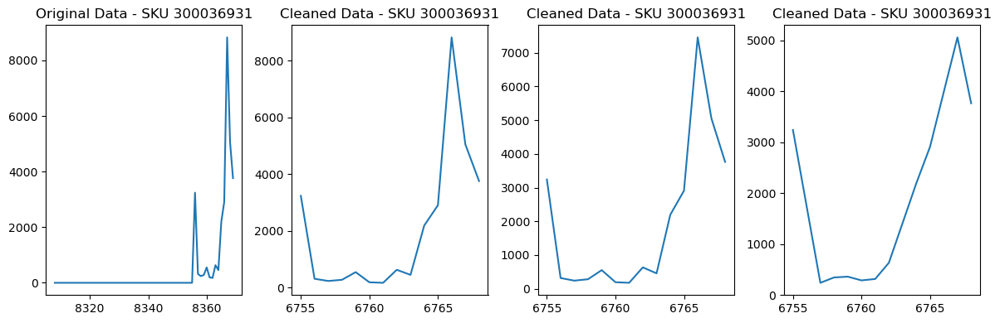

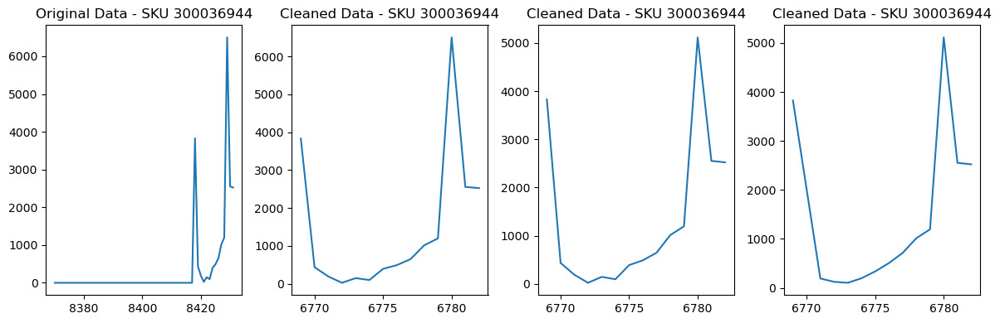

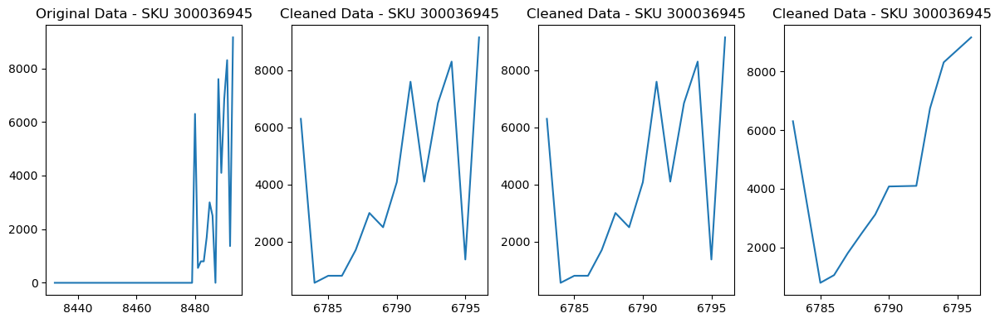

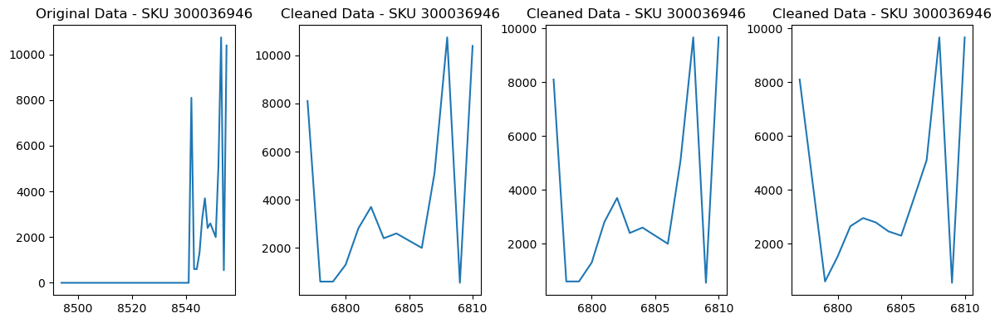

In [15]:
for sku in data['SKU'].unique():
    
    plt.figure(figsize=(12, 4))
    
    # Original data plot
    plt.subplot(1, 4, 1)
    plt.plot(data[data['SKU'] == sku]['Quantity'])
    plt.title(f'Original Data - SKU {sku}')
    
    # Cleaned data plot
    plt.subplot(1, 4, 2)
    plt.plot(cleaned_data_1[cleaned_data_1['SKU'] == sku]['Quantity'])
    plt.title(f'Cleaned Data - SKU {sku}')

    plt.subplot(1, 4, 3)
    plt.plot(cleaned_data_2[cleaned_data_2['SKU'] == sku]['Quantity'])
    plt.title(f'Cleaned Data - SKU {sku}')

    plt.subplot(1, 4, 4)
    plt.plot(cleaned_data_3[cleaned_data_3['SKU'] == sku]['Quantity'])
    plt.title(f'Cleaned Data - SKU {sku}')
    
    plt.tight_layout()
    plt.show()